# U-Resnet-34 for forest segmentation.
# 0.5m resolution

In [44]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "1"

import rasterio
from matplotlib import pyplot as plt
import numpy as np

import keras
import cv2

import aeronet.dataset as ds
from functools import wraps
from torch.utils.data import DataLoader
from aeronet.dataset.utils import parse_directory
import random
import albumentations as alb
from keras import backend as K
from sklearn.metrics import confusion_matrix  
from scipy import ndimage as ndi
from cv2 import findContours

In [2]:
TRAIN_VAL_PATH = '/home/user/data/ilim_data_05/train_val_images/'
TEST_IMAGE_PATH = '/home/user/data/ilim_data_05/test_image'
MODEL_PATH = '/home/user/data/Models/ForestSegmentationModel_ITC.h5'

In [3]:
# MODEL_PATH = '/home/user/data/Models/ITC_60.h5'
# dependencies = {
#     'iou_score': iou_score,
#     'dice_coef': dice_coef
# }
# model = keras.models.load_model(MODEL_PATH, custom_objects=dependencies)

In [4]:
base_model = keras.models.load_model(MODEL_PATH)

/opt/conda/lib/python3.6/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


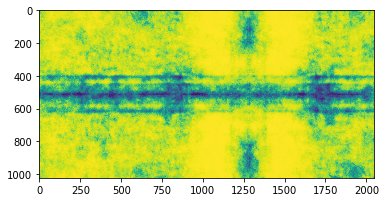

In [5]:
with rasterio.open('/home/user/data/ITC_dataset/irkutsk2_marked/orthophoto.tif') as src:
    img = src.read().transpose(1, 2,0)
pad_0 = 1024 - img.shape[0]
pad_1 = 2048 - img.shape[1]
img_pad = np.pad(img, pad_width=((0, pad_0),(0, pad_1),(0,0)), mode='reflect')
mask = base_model.predict(np.array([img_pad]))
plt.imshow(mask[0,0:img_pad.shape[0],0:img_pad.shape[1],0] )
plt.show()  

# We will train the model on the ITC data 
- change the head
- fix all weights except head
- then fine-tune all the weights until it overfits
- profit?

In [6]:
# new head
x = keras.layers.Conv2D(3, (1,1))(base_model.layers[-1].layers[-3].output)
out = keras.layers.Activation(activation='softmax')(x)
inner_model = keras.models.Model(inputs=[base_model.layers[-1].layers[0].input], outputs=[out])

In [7]:
# Attach lambda layer
y = inner_model(base_model.layers[1].output)
model = keras.models.Model(inputs=[base_model.layers[0].input], outputs=[y])

In [8]:
train_transform = alb.Compose([
    alb.HorizontalFlip(p=0.5),
    alb.VerticalFlip(p=0.5),
    alb.RandomRotate90(p=0.5),
    # blur
    alb.OneOf([
            alb.MotionBlur(p=0.2),
            alb.MedianBlur(blur_limit=1, p=0.1),
            alb.Blur(blur_limit=1, p=0.1),
        ], p=0.2),
    # color transforms
    alb.OneOf(
        [
            alb.RandomBrightnessContrast(),
            alb.RandomGamma(),
            alb.HueSaturationValue(),
            alb.IAASharpen(),
            alb.CLAHE(clip_limit=2),
            alb.IAASharpen(),
        ],
    p=0.2),
], p=0.3)

In [9]:
all_frames = os.listdir(TRAIN_VAL_PATH)
random.seed(230)
random.shuffle(all_frames)

train_data = []
val_data = []
CHANNELS = ['RED', 'GRN', 'BLU']
LABELS = ['bounds', 'trees', 'bg']

for i in range(22):
    filenames=parse_directory(TRAIN_VAL_PATH + str(all_frames[i]), CHANNELS+LABELS)
    train_data.append(ds.BandCollection(filenames))

for i in range(22, 27):
    filenames=parse_directory(TRAIN_VAL_PATH + str(all_frames[i]), CHANNELS+LABELS)
    val_data.append(ds.BandCollection(filenames))

In [10]:
train_dataset = ds.RandomDataset(train_data, (256, 256), CHANNELS, LABELS, train_transform)
# train_dataset = ds.RandomDataset(train_data, (256, 256), CHANNELS, LABELS)
val_dataset = ds.RandomDataset(val_data, (256, 256), CHANNELS, LABELS)

@wraps(DataLoader)
def segmentation_generator(*args, **kwargs):
    #data_loader = DataLoader(*args, **kwargs)
    while True:
        data_loader = DataLoader(*args, **kwargs)
        for batch in data_loader:
            images = batch['image']
            masks = batch['mask']
            yield images.numpy(),  masks.numpy()

train_dataloader = segmentation_generator(train_dataset, batch_size=16, num_workers=0)
val_dataloader = segmentation_generator(val_dataset, batch_size=16, num_workers=0)

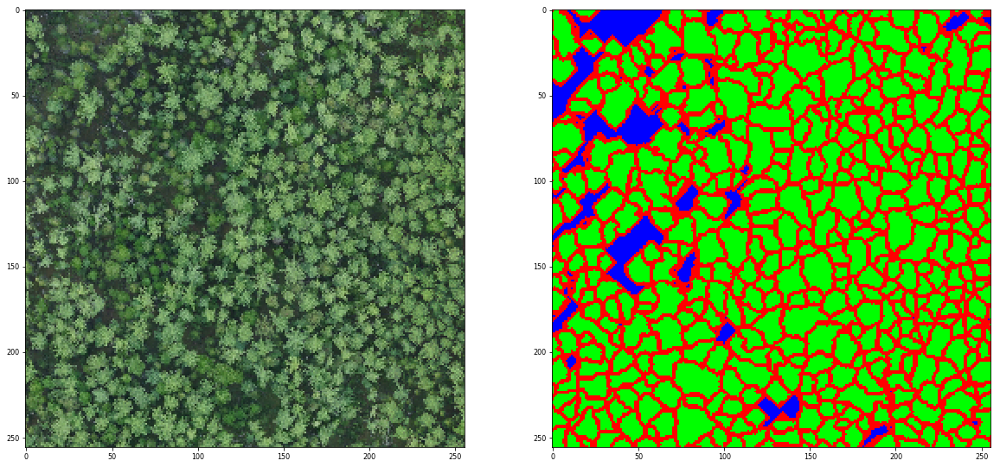

In [202]:
imgs, masks = train_dataloader.__next__()
img = imgs[1]
mask=masks[1]

plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(img)


plt.subplot(122)
plt.imshow(mask*255)
plt.show()



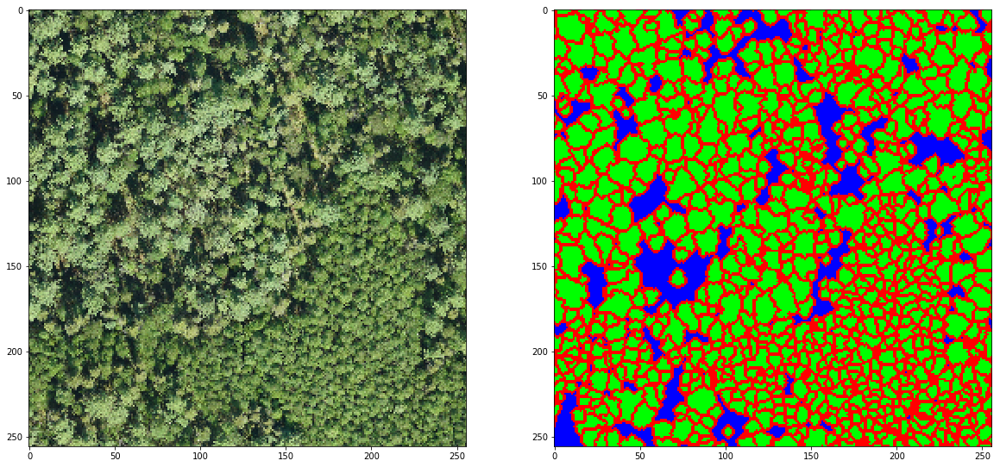

In [12]:
imgs, masks = val_dataloader.__next__()
img = imgs[1]
mask=masks[1]

plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(img)


plt.subplot(122)
plt.imshow(mask*255)
plt.show()

In [13]:
def iou_score(gt, pr, class_weights=1., smooth=1e-12):
    axes = -1
    intersection = K.sum(gt * pr, axis=axes)
    union = K.sum(gt + pr, axis=axes) - intersection
    iou = (intersection + smooth) / (union + smooth)
    # mean per image
    iou = K.mean(iou, axis=0)
    # weighted mean per class
    iou = K.mean(iou * class_weights)
    return iou

def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

In [14]:
opt = keras.optimizers.Adam(lr=0.0001)
loss = keras.losses.categorical_crossentropy
metrics = [iou_score, dice_coef]
model.compile(optimizer=opt, loss=loss, metrics=metrics)

history = model.fit_generator(train_dataloader,
                              steps_per_epoch=100,
                              validation_data=val_dataloader,
                              validation_steps=50,
                              epochs=100,
                              workers=0)

Epoch 1/100
100/100 [==============================] - 36s 360ms/step - loss: 0.9621 - iou_score: 0.2874 - dice_coef: 0.4234 - val_loss: 0.8742 - val_iou_score: 0.3373 - val_dice_coef: 0.4725
Epoch 2/100
100/100 [==============================] - 32s 321ms/step - loss: 0.8158 - iou_score: 0.3746 - dice_coef: 0.5086 - val_loss: 0.8202 - val_iou_score: 0.3516 - val_dice_coef: 0.4913
Epoch 3/100
100/100 [==============================] - 34s 337ms/step - loss: 0.7419 - iou_score: 0.4163 - dice_coef: 0.5466 - val_loss: 0.7882 - val_iou_score: 0.3733 - val_dice_coef: 0.5104
Epoch 4/100
100/100 [==============================] - 32s 325ms/step - loss: 0.7233 - iou_score: 0.4318 - dice_coef: 0.5608 - val_loss: 0.7525 - val_iou_score: 0.3998 - val_dice_coef: 0.5335
Epoch 5/100
100/100 [==============================] - 32s 325ms/step - loss: 0.6816 - iou_score: 0.4491 - dice_coef: 0.5778 - val_loss: 0.7478 - val_iou_score: 0.4181 - val_dice_coef: 0.5459
Epoch 6/100
100/100 [===================

In [109]:
# model.save('/home/user/data/Models/ITC_05_100.h5')
del model

NameError: name 'model' is not defined

In [110]:
MODEL_PATH = '/home/user/data/Models/ITC_05_100.h5'
dependencies = {
    'iou_score': iou_score,
    'dice_coef': dice_coef
}
model = keras.models.load_model(MODEL_PATH, custom_objects=dependencies)

In [111]:
def iou_compute(y_pred, y_true):
    y_pred = y_pred.flatten()
    y_true = y_true.flatten()
    current = confusion_matrix(y_true, y_pred, labels=[0, 1, 2])
    intersection = np.diag(current)
    ground_truth_set = current.sum(axis=1)
    predicted_set = current.sum(axis=0)
    union = ground_truth_set + predicted_set - intersection
    IoU = intersection / union.astype(np.float32)
    return np.mean(IoU)

def dice_compute(y_pred, y_true):
    y_pred = y_pred.flatten()
    y_true = y_true.flatten()
    current = confusion_matrix(y_true, y_pred, labels=[0, 1, 2])
    intersection = np.diag(current)
    return 2. * intersection.sum() / (y_pred.sum() + y_true.sum())

def predict(model, img):
    if img.shape[0] > 1024 or img.shape[1] > 2048:
        print(1024, img.shape[0], 2048, img.shape[1])
        print('Too big')
        return None
    pad_0 = 1024 - img.shape[0]
    pad_1 = 2048 - img.shape[1]
    img_pad = np.pad(img, pad_width=((0, pad_0),(0, pad_1),(0,0)), mode='reflect')
    mask_proba = model.predict(np.array([img_pad]))
    mask_classes = mask_proba.argmax(axis=-1)
    return mask_classes[0, :img.shape[0], :img.shape[1]]

def load_image(image):
    with rasterio.open(image) as src:
        img = src.read().transpose(1,2,0)
        profile = src.profile
    return img, profile

In [195]:
def matching_trees(mask_test_trees, mask_pred_trees, w):
    test_img_centerPoints = np.zeros(mask_test_trees.shape)
    for c in w:
        M = cv2.moments(c)
        if M["m00"] != 0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
        else:
            continue
        test_img_centerPoints[cY, cX] = 1
    x = 0
    for i in range(test_img_centerPoints.shape[0]):
        for j in range(test_img_centerPoints.shape[1]):
            if test_img_centerPoints[i, j] == 1:
                if test_img_centerPoints[i, j] == mask_pred_trees[i, j]:
                    x+=1
    return x

def metrics(mask_test, mask_pred, profile, path):
    iou_compute(mask_test, mask_pred), dice_compute(mask_test, mask_pred)
    
    mask_pred_trees = (mask_pred == 1).astype(np.uint8)
    mask_test_trees = (mask_test == 1).astype(np.uint8)
    
#     profile.update(count=1)
#     with rasterio.open(path+'mask_pred_trees.tif', 'w', **profile) as dst:
#         dst.write(mask_pred_trees, 1)
#     profile.update(count=1)
#     with rasterio.open(path+'mask_test_trees.tif', 'w', **profile) as dst:
#         dst.write(mask_test_trees, 1)

    _, w, e = findContours(mask_test_trees.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    _, w2, e2 = findContours(mask_pred_trees.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x = matching_trees(mask_test_trees, mask_pred_trees, w)
    print(iou_compute(mask_test, mask_pred), dice_compute(mask_test, mask_pred), e.max(), e2.max(), x/e.max())
    return iou_compute(mask_test, mask_pred), dice_compute(mask_test, mask_pred), e.max(), e2.max(), x/e.max()

In [189]:
iou_list = []
dice_list = []
n_trees = []
acc_centroid_list = []

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:34: RasterioDeprecationWarning: Creation keywords stored on datasets by Rasterio versions < 1.0b1 will always be ignored in version 1.0. You may opt in to ignoring them now by setting RIO_IGNORE_CREATION_KWDS=TRUE in your environment.


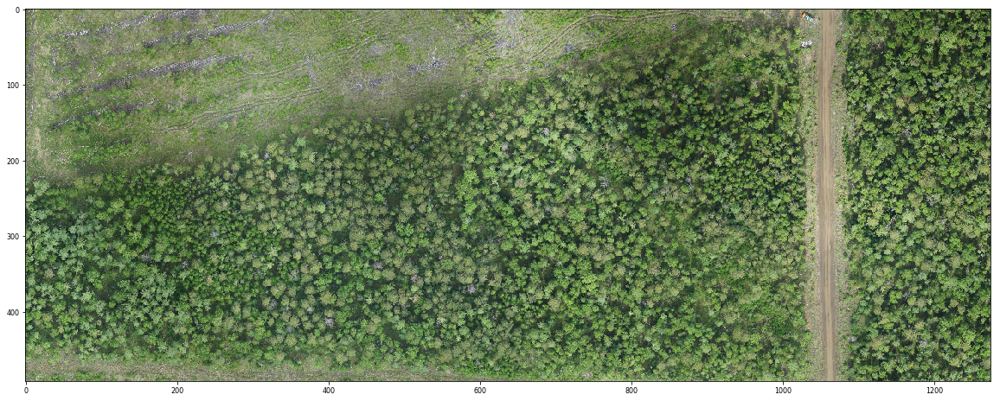

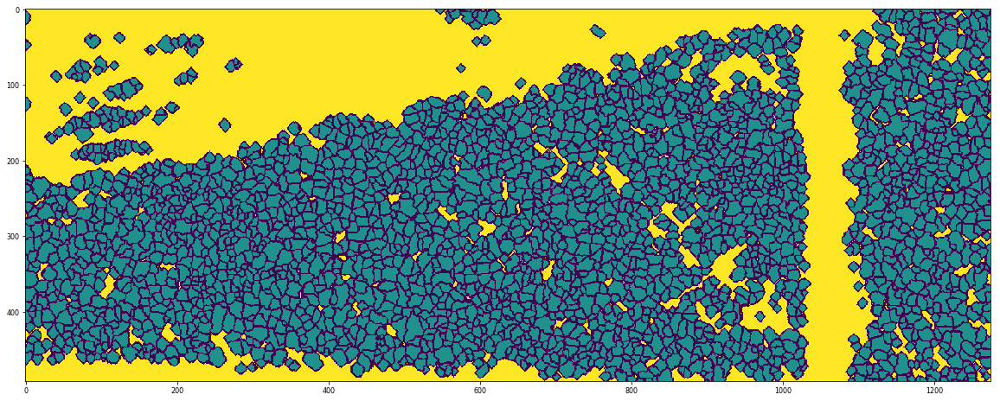

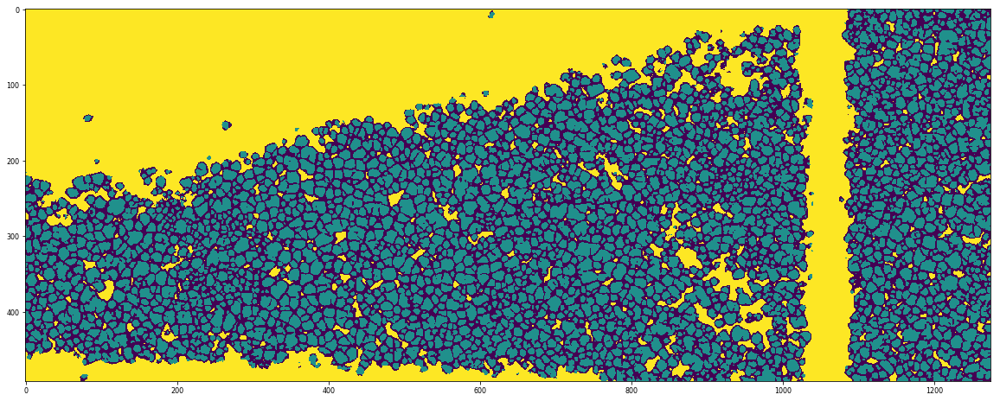

0.5742968628103386 0.692260255648712 2595 2647 0.859344894026975


In [219]:
test_img, profile = load_image('/home/user/data/ilim_data_05/test_image/27/test_img.tif')
mask_pred = predict(model, test_img)

mask_test, _ = load_image('/home/user/data/ilim_data_05/test_image/27/mask.tif')
mask_test = mask_test.argmax(axis=-1)

# with rasterio.open('/home/user/data/ilim_data_05/test_image/27/mask_pred.tif', 'w', **profile) as dst:
#     dst.write(mask_pred)

plt.figure(figsize=(20,10))
plt.imshow(test_img)
# plt.imshow(mask_pred, alpha=0.2)
plt.figure(figsize=(20,10))
plt.imshow(mask_test)
plt.figure(figsize=(20,10))
plt.imshow(mask_pred)
plt.show()

iou, dice, n_trees_test, n_trees_pred, acc_centroid = metrics(mask_test, mask_pred, profile, '/home/user/data/ilim_data_05/test_image/27/')
iou_list.append(iou)
dice_list.append(dice)
n_trees.append([n_trees_test, n_trees_pred])
acc_centroid_list.append(acc_centroid)

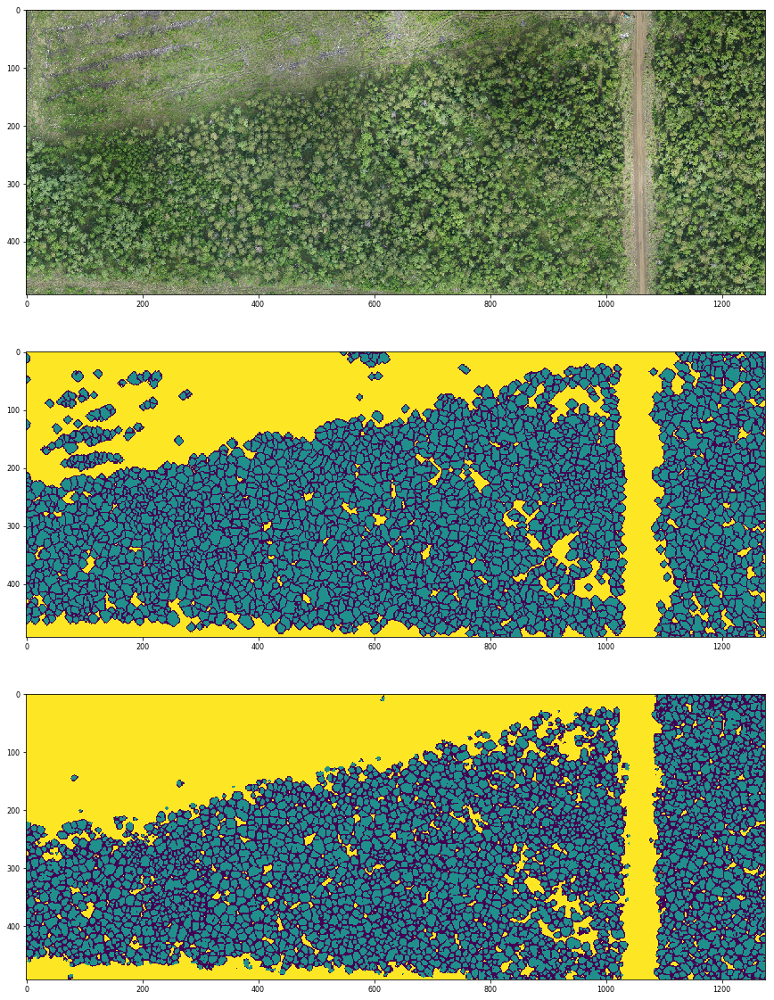

In [220]:
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
# plt.figure(figsize=(20,10))
plt.imshow(test_img)
plt.subplot(3,1,2)
# plt.figure(figsize=(20,10))
plt.imshow(mask_test)
plt.subplot(3,1,3)
# plt.figure(figsize=(20,10))
plt.imshow(mask_pred)
# plt.show()

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:34: RasterioDeprecationWarning: Creation keywords stored on datasets by Rasterio versions < 1.0b1 will always be ignored in version 1.0. You may opt in to ignoring them now by setting RIO_IGNORE_CREATION_KWDS=TRUE in your environment.


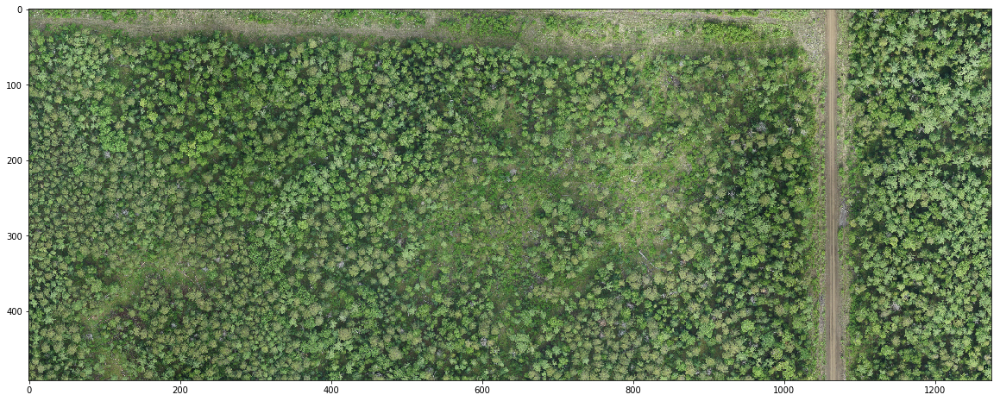

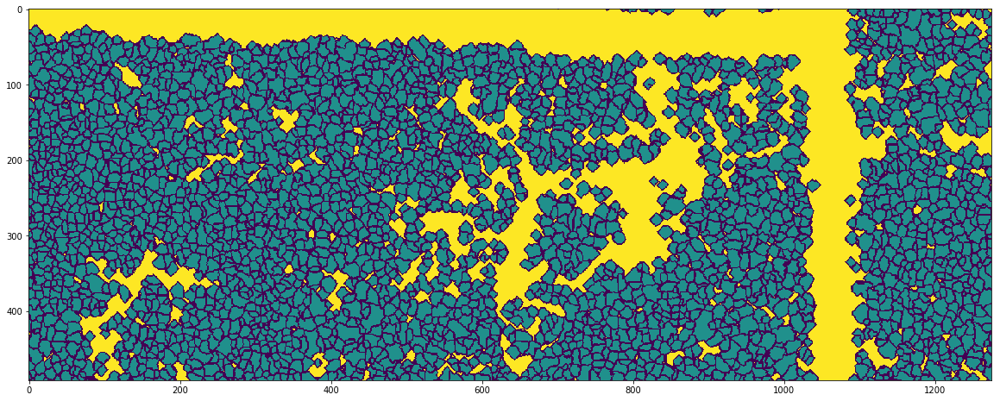

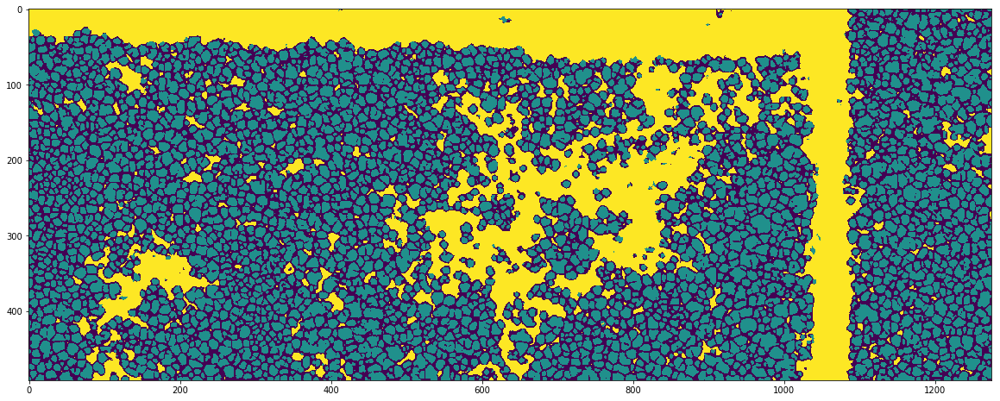

0.5623040436102813 0.7576776484806746 2932 3079 0.9096180081855388


In [191]:
test_img, profile = load_image('/home/user/data/ilim_data_05/test_image/28/test_img.tif')
mask_pred = predict(model, test_img)

mask_test, _ = load_image('/home/user/data/ilim_data_05/test_image/28/mask.tif')
mask_test = mask_test.argmax(axis=-1)

plt.figure(figsize=(20,10))
plt.imshow(test_img)
plt.figure(figsize=(20,10))
plt.imshow(mask_test)
plt.figure(figsize=(20,10))
plt.imshow(mask_pred)
plt.show()

iou, dice, n_trees_test, n_trees_pred, acc_centroid = metrics(mask_test, mask_pred, profile, '/home/user/data/ilim_data_05/test_image/28/')
iou_list.append(iou)
dice_list.append(dice)
n_trees.append([n_trees_test, n_trees_pred])
acc_centroid_list.append(acc_centroid)

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:34: RasterioDeprecationWarning: Creation keywords stored on datasets by Rasterio versions < 1.0b1 will always be ignored in version 1.0. You may opt in to ignoring them now by setting RIO_IGNORE_CREATION_KWDS=TRUE in your environment.


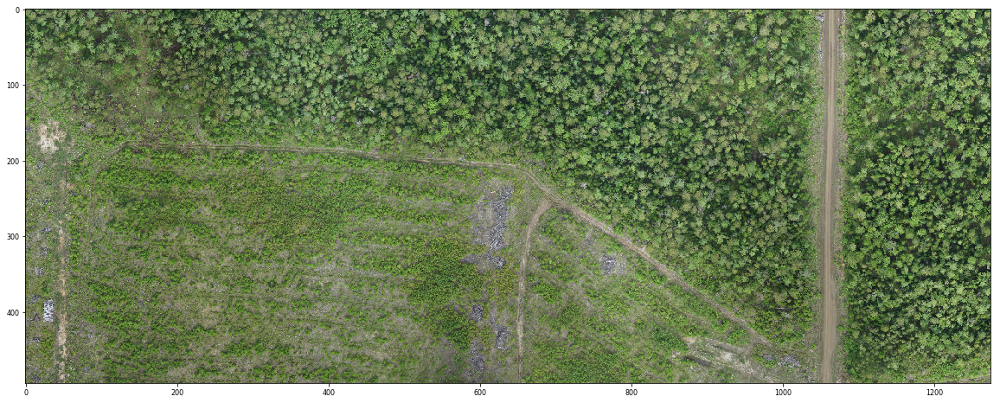

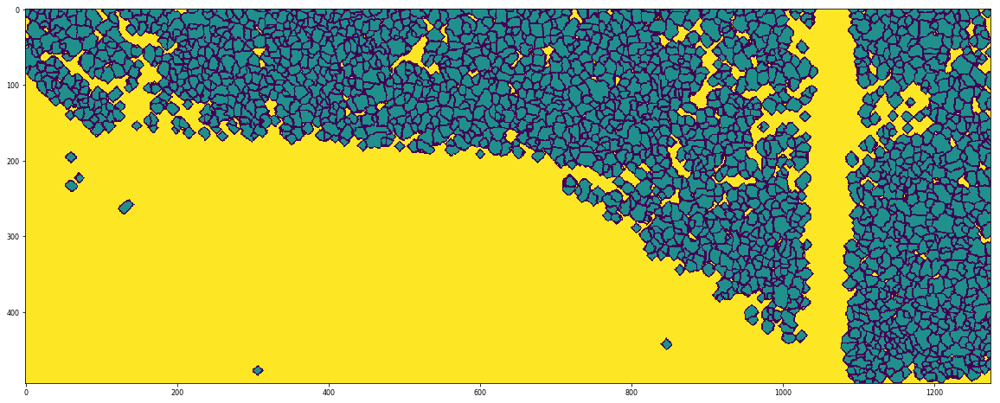

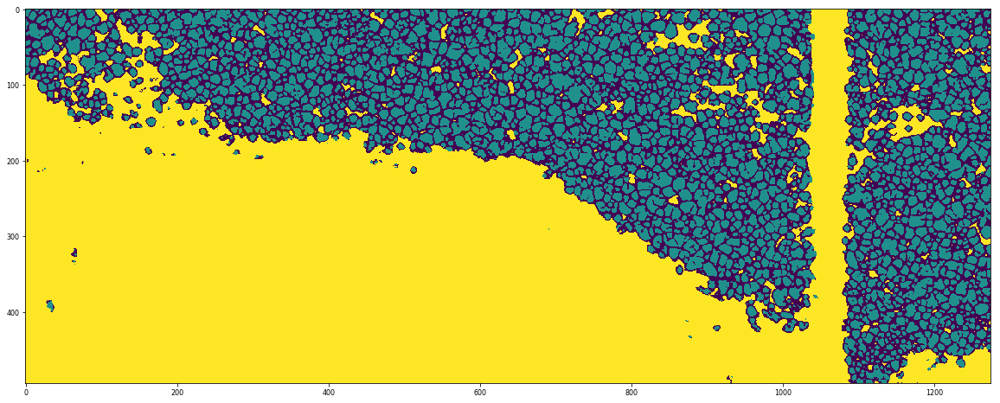

0.620650124039515 0.6076436780924065 1903 2090 0.8617971623751971


In [221]:
test_img, profile = load_image('/home/user/data/ilim_data_05/test_image/29/test_img.tif')
mask_pred = predict(model, test_img)

mask_test, _ = load_image('/home/user/data/ilim_data_05/test_image/29/mask.tif')
mask_test = mask_test.argmax(axis=-1)

plt.figure(figsize=(20,10))
plt.imshow(test_img)
plt.figure(figsize=(20,10))
plt.imshow(mask_test)
plt.figure(figsize=(20,10))
plt.imshow(mask_pred)
plt.show()

iou, dice, n_trees_test, n_trees_pred, acc_centroid = metrics(mask_test, mask_pred, profile, '/home/user/data/ilim_data_05/test_image/29/')
iou_list.append(iou)
dice_list.append(dice)
n_trees.append([n_trees_test, n_trees_pred])
acc_centroid_list.append(acc_centroid)

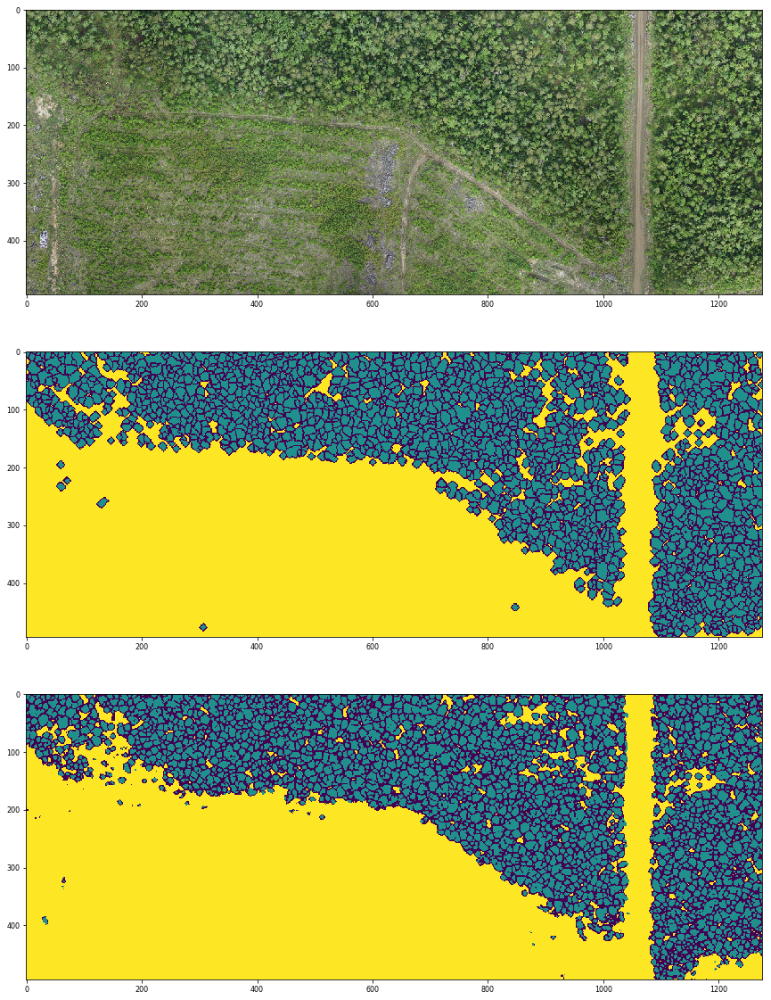

In [222]:
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
# plt.figure(figsize=(20,10))
plt.imshow(test_img)
plt.subplot(3,1,2)
# plt.figure(figsize=(20,10))
plt.imshow(mask_test)
plt.subplot(3,1,3)
# plt.figure(figsize=(20,10))
plt.imshow(mask_pred)
# plt.show()

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:34: RasterioDeprecationWarning: Creation keywords stored on datasets by Rasterio versions < 1.0b1 will always be ignored in version 1.0. You may opt in to ignoring them now by setting RIO_IGNORE_CREATION_KWDS=TRUE in your environment.


0.4186713536069037 0.7166261353799953 4014 3913 0.8948679621325362


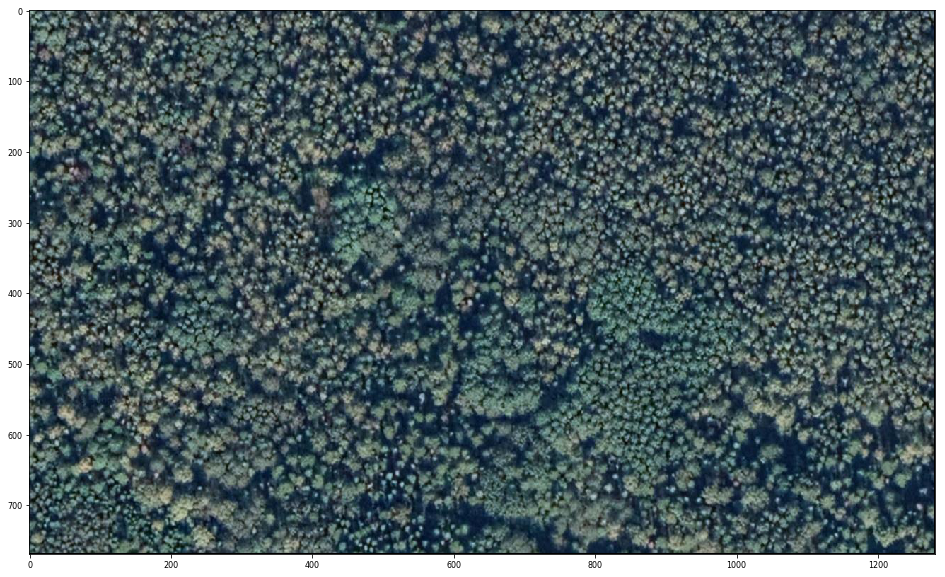

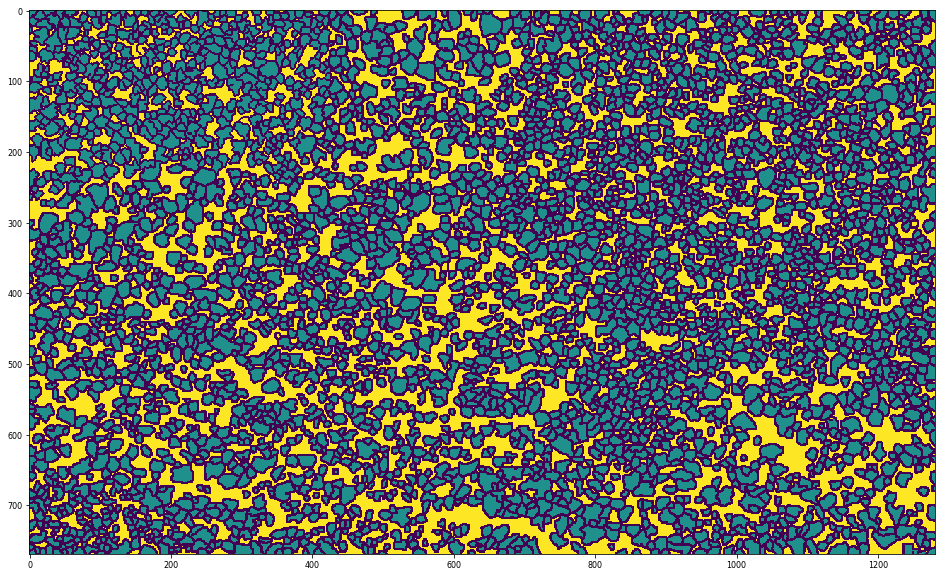

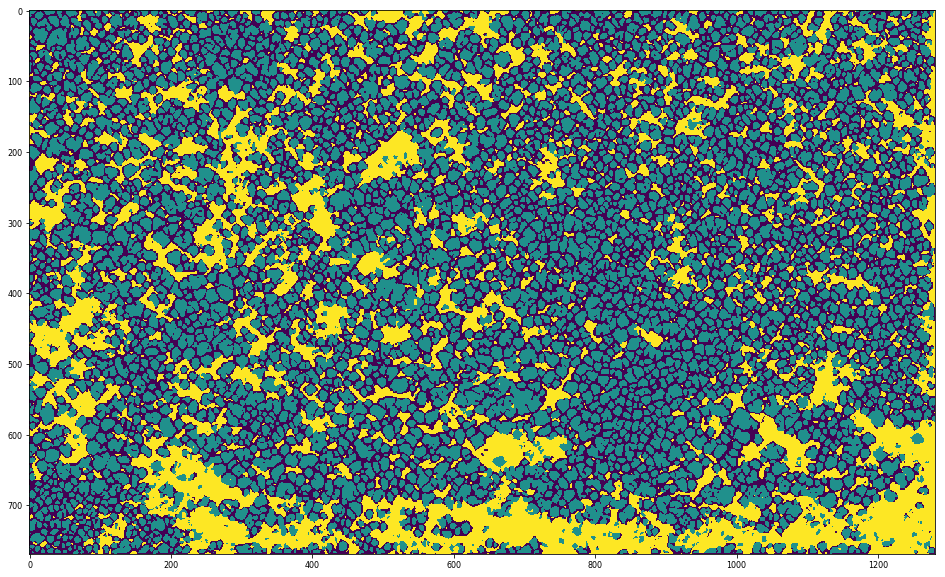

In [223]:
test_img, profile = load_image('/home/user/data/ilim_data_05/test_image/perm1_05/test_img.tif')
mask_pred = predict(model, test_img)

mask_test, _ = load_image('/home/user/data/ilim_data_05/test_image/perm1_05/mask.tif')
mask_test = mask_test.argmax(axis=-1)

plt.figure(figsize=(20,10))
plt.imshow(test_img)
plt.figure(figsize=(20,10))
plt.imshow(mask_test)
plt.figure(figsize=(20,10))
plt.imshow(mask_pred)

iou, dice, n_trees_test, n_trees_pred, acc_centroid = metrics(mask_test, mask_pred, profile, '/home/user/data/ilim_data_05/test_image/perm1_05/')
iou_list.append(iou)
dice_list.append(dice)
n_trees.append([n_trees_test, n_trees_pred])
acc_centroid_list.append(acc_centroid)

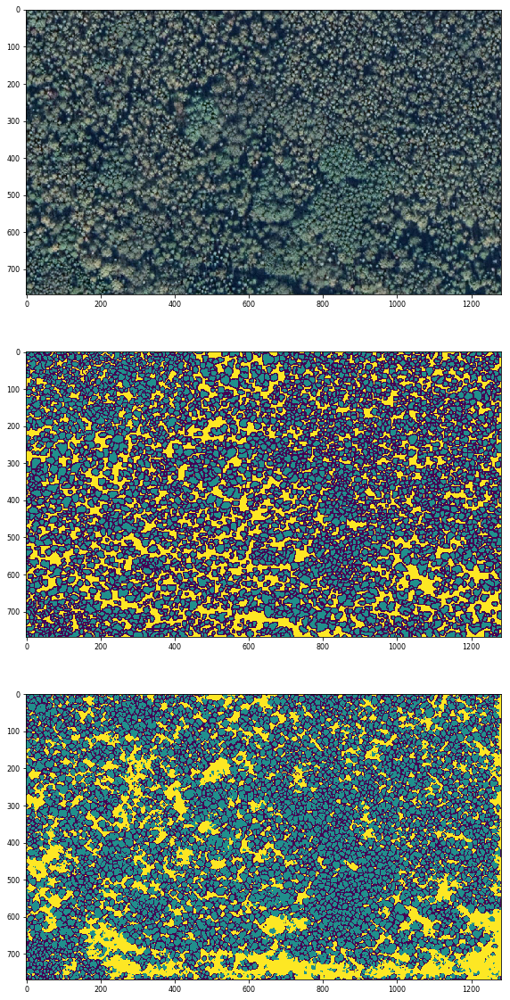

In [224]:
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
# plt.figure(figsize=(20,10))
plt.imshow(test_img)
plt.subplot(3,1,2)
# plt.figure(figsize=(20,10))
plt.imshow(mask_test)
plt.subplot(3,1,3)
# plt.figure(figsize=(20,10))
plt.imshow(mask_pred)
# plt.show()

In [194]:
print(np.mean(iou_list[:3]), iou_list[3])
print(np.mean(dice_list[:3]), dice_list[3])
print(np.sum(n_trees[:3], axis=0), n_trees[3])
print(np.mean(acc_centroid_list[:3]), acc_centroid_list[3])

0.5857503434867116 0.4186713536069037
0.6858605274072644 0.7166261353799953
[7430 7816] [4014, 3913]
0.8769200215292369 0.8948679621325362


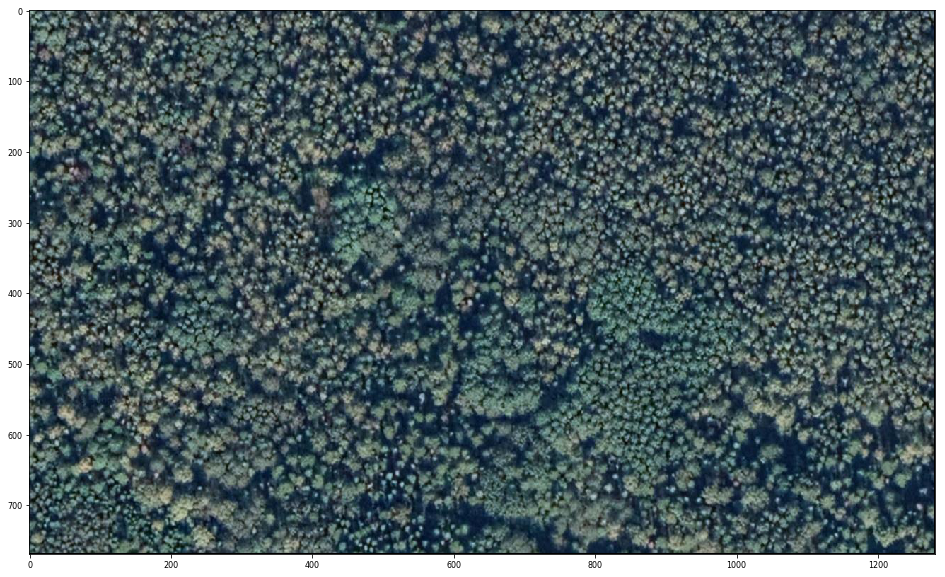

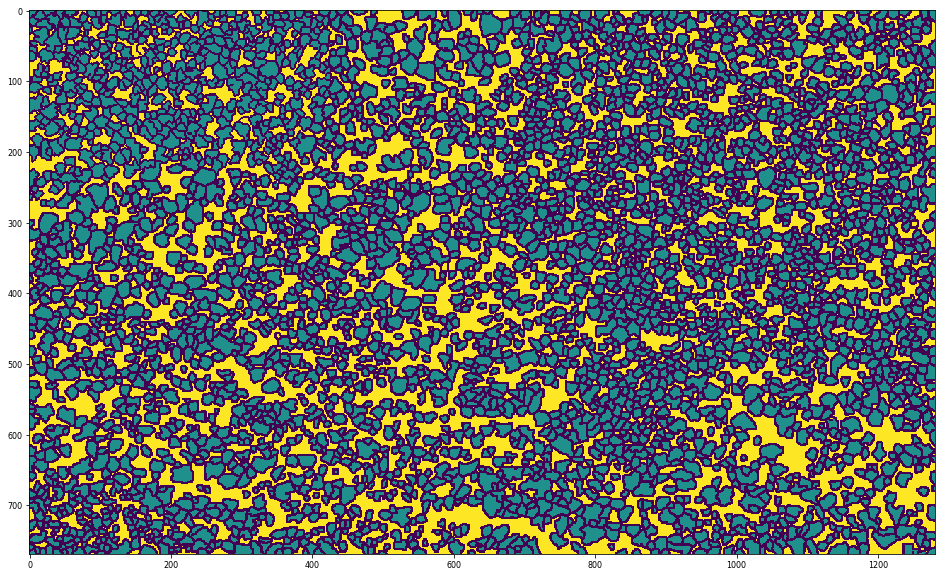

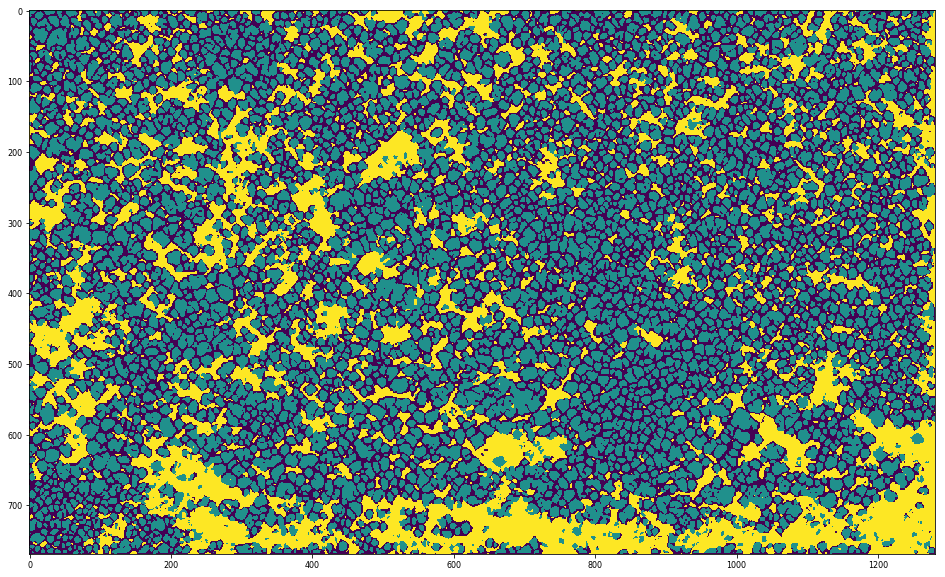

In [200]:
plt.figure(figsize=(20,10))
plt.imshow(test_img)
plt.figure(figsize=(20,10))
plt.imshow(mask_test)
plt.figure(figsize=(20,10))
plt.imshow(mask_pred)
plt.show()

In [206]:
mask_pred_trees = (mask_pred == 1).astype(np.uint8)
mask_test_trees = (mask_test == 1).astype(np.uint8)

confusion_matrix(mask_test_trees.flatten(), mask_pred_trees.flatten())

array([[301270,  46581],
       [ 86411, 193038]])

In [210]:
from sklearn.metrics import recall_score, precision_score, f1_score
recall_score(mask_test_trees.flatten(), mask_pred_trees.flatten())
f1_score(mask_test_trees.flatten(), mask_pred_trees.flatten())

0.7437869412100149

In [217]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)